<a href="https://colab.research.google.com/github/simulate111/Data-Science_2024/blob/main/Mini_Project_3_Abhinandan_Roul.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Loading the data

In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import os, csv
from operator import itemgetter
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
artists_df=pd.read_csv('https://raw.githubusercontent.com/AbhinandanRoul/GitPractice/refs/heads/main/artists.csv')
schools_df=pd.read_csv('https://raw.githubusercontent.com/AbhinandanRoul/GitPractice/refs/heads/main/schools.csv')
relationships_df =pd.read_csv('https://raw.githubusercontent.com/AbhinandanRoul/GitPractice/refs/heads/main/relationships.csv')
institutions_df =pd.read_csv('https://raw.githubusercontent.com/AbhinandanRoul/GitPractice/refs/heads/main/institutions.csv')


# Save locally
artists_df.to_csv('artists.csv',index=False)
schools_df.to_csv('schools.csv',index=False)
relationships_df.to_csv('relationships.csv',index=False)
institutions_df.to_csv('institutions.csv',index=False)

In [3]:
print("Relationship file:\n",relationships_df.isna().sum(),end="\n--------------\n")
print("Artists file:\n",artists_df.isna().sum(),end="\n--------------\n")
print("schools file:\n",schools_df.isna().sum(),end="\n--------------\n")
print("Institution file:\n",institutions_df.isna().sum(),end="\n--------------\n")

Relationship file:
 artistUrl           0
friends          2580
influenced_by    2512
influenced_on    2637
institution      2362
movements          40
school           1966
type                1
dtype: int64
--------------
Artists file:
 artistUrl           0
id                  0
image               0
nation             32
title               0
totalWorksTitle     0
year                1
dtype: int64
--------------
schools file:
 title    0
url      0
dtype: int64
--------------
Institution file:
 city       2
country    2
title      0
url        0
dtype: int64
--------------


### Plotting Freq. Distribution of Artist Nationalities

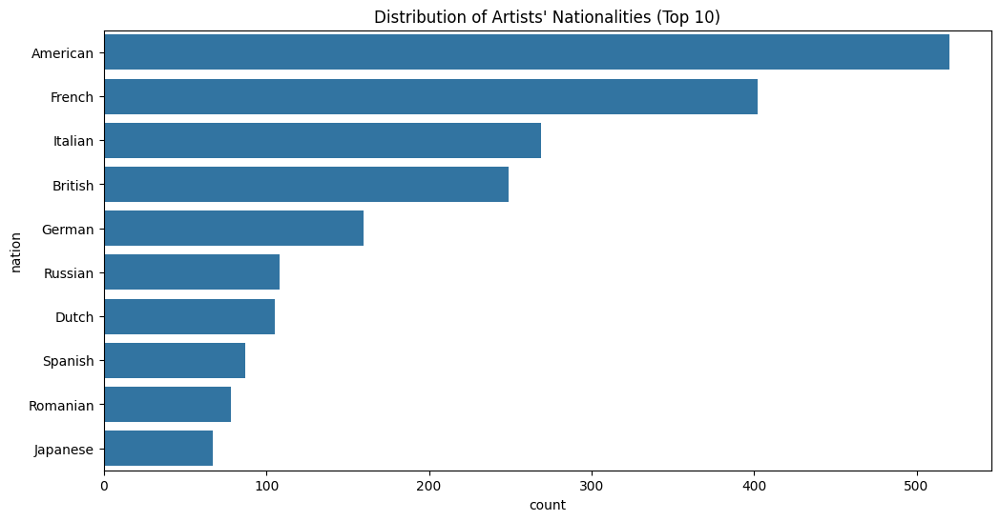

In [4]:
plt.figure(figsize=(12, 6))
top_10_nations = artists_df['nation'].value_counts().nlargest(10).index
sns.countplot(y=artists_df['nation'], order=top_10_nations)
plt.title("Distribution of Artists' Nationalities (Top 10)")
plt.show()

### Plotting artists vs their artwork counts

<ipython-input-5-0550fb4a0423>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_artists.values, y=top_10_artists.index, palette="viridis") # switched x and y for better readability


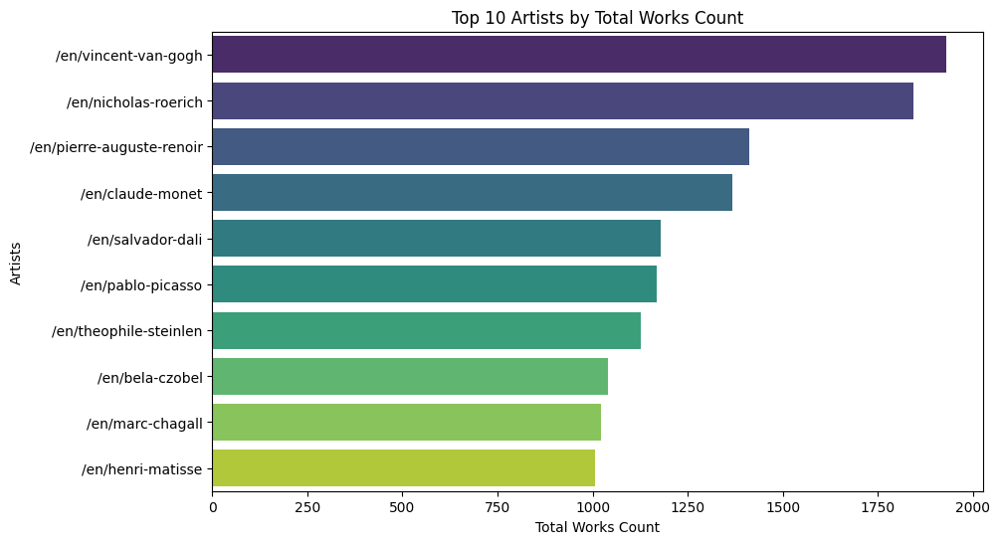

In [5]:
artists_df['totalWorksCount'] = artists_df['totalWorksTitle'].str.extract('(\d+)').astype(int)

# Group by artistUrl
top_10_artists = artists_df.groupby('artistUrl')['totalWorksCount'].sum().nlargest(10)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_artists.values, y=top_10_artists.index, palette="viridis") # switched x and y for better readability
plt.title("Top 10 Artists by Total Works Count")
plt.xlabel("Total Works Count")
plt.ylabel("Artists")
plt.show()

### Plotting Frequency count of movements

In [6]:
df_movements = relationships_df.assign(movements=relationships_df['movements'].astype(str).str.split(',')).explode('movements')
df_movements.head()

,artistUrl,friends,influenced_by,influenced_on,institution,movements,school,type
0,/en/apelles,NaN,/en/ancient-greek-painting,/en/ancient-greek-painting,NaN,Classical Period (480 - 323 BC),/en/artists-by-painting-school/heptanese-ionia...,Artists
0,/en/apelles,NaN,/en/ancient-greek-painting,/en/ancient-greek-painting,NaN,Hellenistic Period (323-31 BC),/en/artists-by-painting-school/heptanese-ionia...,Artists
1,/en/wang-wei,NaN,NaN,NaN,NaN,Tang Dynasty (618–907),NaN,Artists
2,/en/ancient-egyptian-painting,NaN,NaN,"/en/fayum-portrait,/en/ancient-greek-painting,...",NaN,Early Dynastic Period (3150 – 2686 BC),NaN,Collections
2,/en/ancient-egyptian-painting,NaN,NaN,"/en/fayum-portrait,/en/ancient-greek-painting,...",NaN,Old Kingdom (2686–2181 BC),NaN,Collections


<ipython-input-7-5a708cddff7d>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_movements.values, y=top_10_movements.index, palette="viridis")


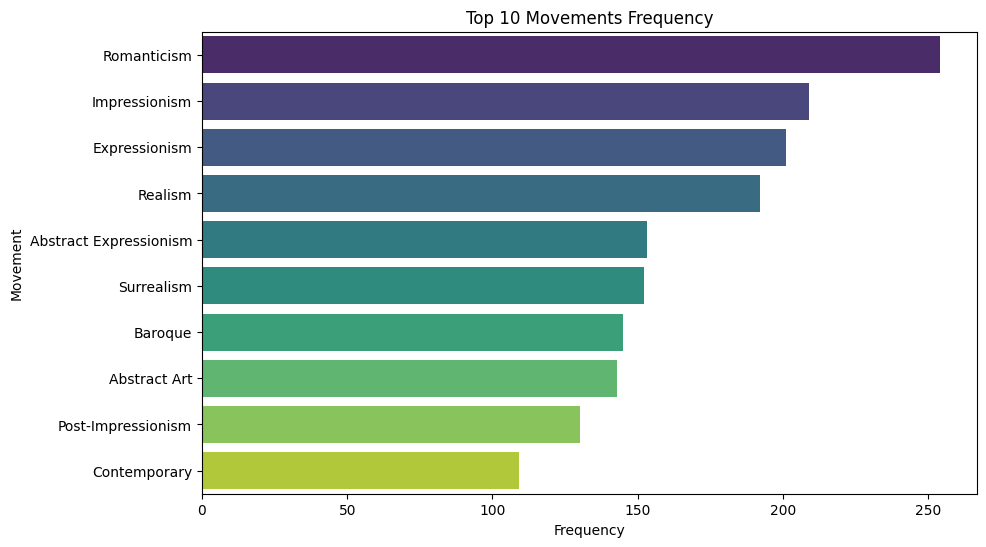

In [7]:

df_movements = relationships_df.assign(movements=relationships_df['movements'].astype(str).str.split(',')).explode('movements')
movement_counts = df_movements['movements'].value_counts()

top_10_movements = movement_counts.head(10)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_movements.values, y=top_10_movements.index, palette="viridis")
plt.title("Top 10 Movements Frequency")
plt.xlabel("Frequency")
plt.ylabel("Movement")
plt.show()

## Splitting values

In [8]:
## To split the multiple values in one column into muliple entries
# Split 'influenced_by' column
df_influenced_by = relationships_df.assign(influenced_by=relationships_df['influenced_by'].str.split(',')).explode('influenced_by')

# Split 'influenced_on' column
df_influenced_on = df_influenced_by.assign(influenced_on=df_influenced_by['influenced_on'].str.split(',')).explode('influenced_on')

df_influenced_on.to_csv("expanded_relations.csv", index=False)
expanded_relationships_df =pd.read_csv('/content/expanded_relations.csv')

df_movements = expanded_relationships_df.assign(movements=expanded_relationships_df['movements'].str.split(',')).explode('movements')
df_institution = df_movements.assign(institution=df_movements['institution'].str.split(',')).explode('institution')

# Save the result to a new CSV file
df_institution.to_csv("expanded_relations_final.csv", index=False)
expanded_relationships_df_final =pd.read_csv('/content/expanded_relations_final.csv')

## Creating the Network

In [9]:
import networkx as nx
import pandas as pd
import csv

# Initialize the graph
G = nx.Graph()

# Artists as Nodes with Attributes
with open('/content/artists.csv', 'r') as nodecsv:
    nodereader = csv.reader(nodecsv)
    nodes = [n for n in nodereader][1:]
for node in nodes:
    artist_url = node[0]
    nation = node[3]
    title = node[4]
    total_works_title = node[5]
    G.add_node(artist_url, type='artist', nation=nation, title=title, totalWorksTitle=total_works_title)
print("Artist nodes:", list(G.nodes(data=True))[:5])

# Institutions as Nodes with Attributes
with open('/content/institutions.csv', 'r') as nodecsv:
    nodereader = csv.reader(nodecsv)
    institutions = [n for n in nodereader][1:]
for institution in institutions:
    title = institution[2]
    city = institution[0]
    country = institution[1]
    url = institution[3]
    G.add_node(url, type='institution', city=city, country=country, url=url)
print("Institution nodes:", list(G.nodes(data=True))[:5])

# Schools as Nodes with Attributes
with open('/content/schools.csv', 'r') as nodecsv:
    nodereader = csv.reader(nodecsv)
    schools = [n for n in nodereader][1:]
for school in schools:
    title = school[0]
    url = school[1]
    G.add_node(title, type='school', title=title, url=url)
print("School nodes:", list(G.nodes(data=True))[:5])

# Movements as Nodes
with open('/content/expanded_relations_final.csv', 'r') as nodecsv:
    nodereader = csv.reader(nodecsv)
    movements = [n for n in nodereader][1:]
for movement in movements:
    movement_title = movement[5]
    G.add_node(movement_title, type='movement')
print("Movement nodes:", list(G.nodes(data=True))[:5])

# Nations as Nodes (if they aren’t already in the graph as part of artist attributes)
with open('/content/artists.csv', 'r') as nodecsv:
    nodereader = csv.reader(nodecsv)
    nodes = [n for n in nodereader][1:]
for node in nodes:
    nation = node[3]
    if nation not in G:
        G.add_node(nation, type='nation')
print("Nation nodes:", list(G.nodes(data=True))[:5])

# -----------------------------------------------------------------------------------------------------------------------
# Add edges for each relationship with different attributes

# Edge: artistUrl -> influenced_on
for index, row in expanded_relationships_df.iterrows():
    if pd.notna(row['influenced_on']):
        G.add_edge(row['artistUrl'], row['influenced_on'], relationship="artist_inf_on")

# Edge: artistUrl -> influenced_by
for index, row in expanded_relationships_df.iterrows():
    if pd.notna(row['influenced_by']):
        G.add_edge(row['artistUrl'], row['influenced_by'], relationship="artist_inf_by")

# Edge: movements -> influenced_on
for index, row in expanded_relationships_df.iterrows():
    if pd.notna(row['influenced_on']) and pd.notna(row['movements']):
        G.add_edge(row['movements'], row['influenced_on'], relationship="movements_inf_on")

# Edge: movements -> influenced_by
for index, row in expanded_relationships_df.iterrows():
    if pd.notna(row['influenced_by']) and pd.notna(row['movements']):
        G.add_edge(row['movements'], row['influenced_by'], relationship="movements_inf_by")

# Edge: institution -> influenced_by
for index, row in expanded_relationships_df.iterrows():
    if pd.notna(row['influenced_by']) and pd.notna(row['institution']):
        G.add_edge(row['institution'], row['influenced_by'], relationship="institution_inf_by")

# Edge: institution -> influenced_on
for index, row in expanded_relationships_df.iterrows():
    if pd.notna(row['influenced_on']) and pd.notna(row['institution']):
        G.add_edge(row['institution'], row['influenced_on'], relationship="institution_inf_on")

# Edge: artistUrl -> nation
for index, row in artists_df.iterrows():
    if pd.notna(row['artistUrl']) and pd.notna(row['nation']):
        G.add_edge(row['artistUrl'], row['nation'], relationship="artist_to_nation")

# Edge: artistUrl -> friend
for index, row in expanded_relationships_df.iterrows():
    if pd.notna(row['artistUrl']) and pd.notna(row['friends']):
        friends_list = row['friends'].split(',')
        for friend in friends_list:
            G.add_edge(row['artistUrl'], friend.strip(), relationship="friend")


Artist nodes: [('/en/ancient-egyptian-painting', {'type': 'artist', 'nation': 'Egyptians', 'title': 'Ancient Egypt', 'totalWorksTitle': '169 artworks'}), ('/en/ancient-greek-pottery', {'type': 'artist', 'nation': 'Greeks', 'title': 'Ancient Greek Pottery', 'totalWorksTitle': '87 artworks'}), ('/en/ancient-greek-painting', {'type': 'artist', 'nation': 'Greeks', 'title': 'Ancient Greek Painting and Sculpture', 'totalWorksTitle': '76 artworks'}), ('/en/apelles', {'type': 'artist', 'nation': 'Greek', 'title': 'Apelles', 'totalWorksTitle': '8 artworks'}), ('/en/fayum-portrait', {'type': 'artist', 'nation': 'Egyptians', 'title': 'Fayum portrait', 'totalWorksTitle': '76 artworks'})]
Institution nodes: [('/en/ancient-egyptian-painting', {'type': 'artist', 'nation': 'Egyptians', 'title': 'Ancient Egypt', 'totalWorksTitle': '169 artworks'}), ('/en/ancient-greek-pottery', {'type': 'artist', 'nation': 'Greeks', 'title': 'Ancient Greek Pottery', 'totalWorksTitle': '87 artworks'}), ('/en/ancient-gre

In [10]:
print("Nodes in the graph:")
print(G.nodes(data=True))

print("\nEdges in the graph:")
print(G.edges(data=True))

Nodes in the graph:
[('/en/ancient-egyptian-painting', {'type': 'artist', 'nation': 'Egyptians', 'title': 'Ancient Egypt', 'totalWorksTitle': '169 artworks'}), ('/en/ancient-greek-pottery', {'type': 'artist', 'nation': 'Greeks', 'title': 'Ancient Greek Pottery', 'totalWorksTitle': '87 artworks'}), ('/en/ancient-greek-painting', {'type': 'artist', 'nation': 'Greeks', 'title': 'Ancient Greek Painting and Sculpture', 'totalWorksTitle': '76 artworks'}), ('/en/apelles', {'type': 'artist', 'nation': 'Greek', 'title': 'Apelles', 'totalWorksTitle': '8 artworks'}), ('/en/fayum-portrait', {'type': 'artist', 'nation': 'Egyptians', 'title': 'Fayum portrait', 'totalWorksTitle': '76 artworks'}), ('/en/orthodox-icons', {'type': 'artist', 'nation': 'Greeks', 'title': 'Orthodox Icons', 'totalWorksTitle': '437 artworks'}), ('/en/wu-daozi', {'type': 'artist', 'nation': 'Chinese', 'title': 'Wu Daozi', 'totalWorksTitle': '8 artworks'}), ('/en/wang-wei', {'type': 'artist', 'nation': 'Chinese', 'title': 'Wan

In [11]:
# Number of nodes
num_nodes = G.number_of_nodes()
print(f"Number of nodes: {num_nodes}")

# Number of edges
num_edges = G.number_of_edges()
print(f"Number of edges: {num_edges}")

Number of nodes: 4002
Number of edges: 7958


In [12]:
# print number of nodes, number of edges, average degree, the graph content

print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())

degree_sequence = [d for n, d in G.degree()]
avg_degree = sum(degree_sequence) / len(degree_sequence)
print("Average degree:", avg_degree)

print("Graph content:")
print(G.nodes(data=True))
print(G.edges(data=True))

Number of nodes: 4002
Number of edges: 7958
Average degree: 3.9770114942528734
Graph content:
[('/en/ancient-egyptian-painting', {'type': 'artist', 'nation': 'Egyptians', 'title': 'Ancient Egypt', 'totalWorksTitle': '169 artworks'}), ('/en/ancient-greek-pottery', {'type': 'artist', 'nation': 'Greeks', 'title': 'Ancient Greek Pottery', 'totalWorksTitle': '87 artworks'}), ('/en/ancient-greek-painting', {'type': 'artist', 'nation': 'Greeks', 'title': 'Ancient Greek Painting and Sculpture', 'totalWorksTitle': '76 artworks'}), ('/en/apelles', {'type': 'artist', 'nation': 'Greek', 'title': 'Apelles', 'totalWorksTitle': '8 artworks'}), ('/en/fayum-portrait', {'type': 'artist', 'nation': 'Egyptians', 'title': 'Fayum portrait', 'totalWorksTitle': '76 artworks'}), ('/en/orthodox-icons', {'type': 'artist', 'nation': 'Greeks', 'title': 'Orthodox Icons', 'totalWorksTitle': '437 artworks'}), ('/en/wu-daozi', {'type': 'artist', 'nation': 'Chinese', 'title': 'Wu Daozi', 'totalWorksTitle': '8 artworks'

In [13]:
density = nx.density(G)
print("Network density:", density)


Network density: 0.000994004372470101


In [14]:
# Plotting the BIG Graph, takes a lot of time, so I commeneted it.
#plot the graph
# plt.figure(figsize=(60, 60))  # Increase the figure size
# pos = nx.spring_layout(G, k=0.3)  # Adjust the k parameter for node spacing
# nx.draw(G, pos, with_labels=True, node_color='green', node_size=250, edge_color='gray', font_size=8)
# plt.show()

## Plotting different Graph visualizations

*   Plot of random 500 nodes, with each node type is a different color


PLEASE NOTE- As it plots random nodes, each graph viz would be slightly different than the report.


<ipython-input-15-1517b9c55b58>:6: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(G.nodes(), 500)


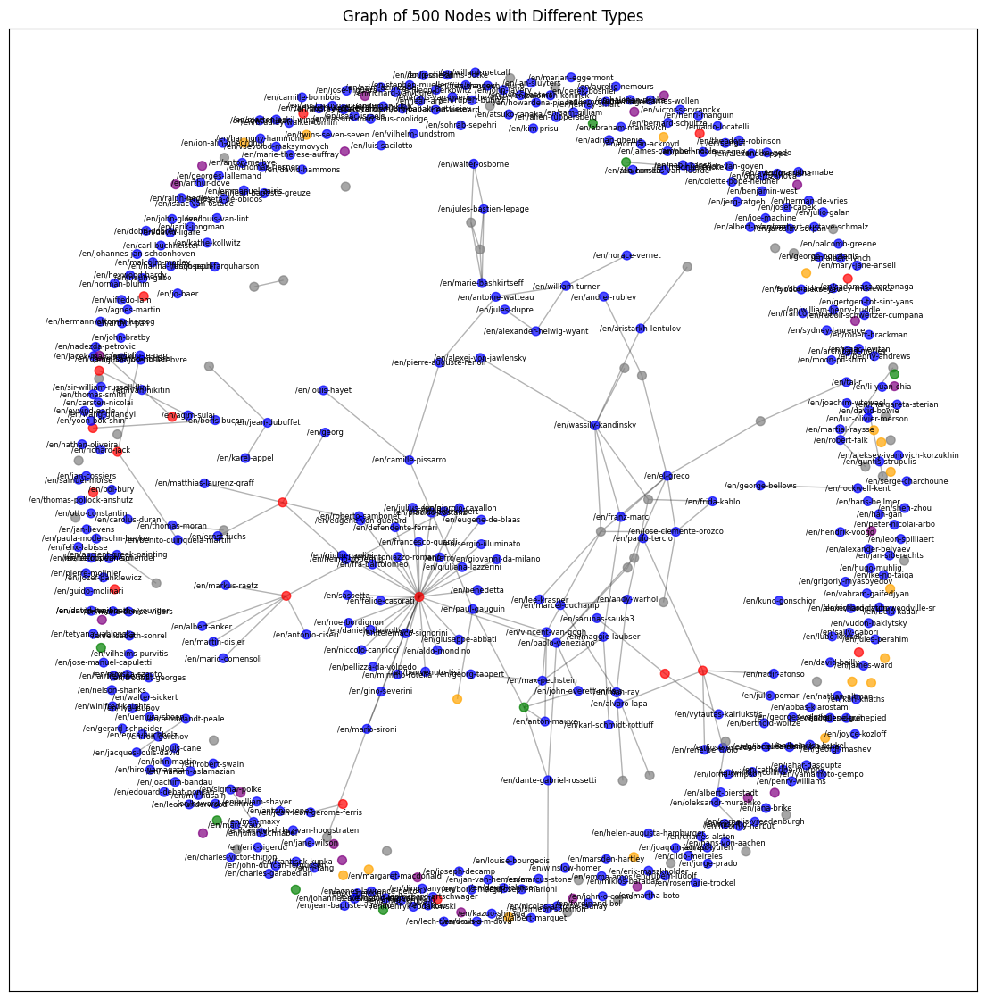

In [15]:
import random
import matplotlib.pyplot as plt

random.seed(42)  # Set a seed for reproducibility

sampled_nodes = random.sample(G.nodes(), 500)

# Create a subgraph with only the sampled nodes and their edges
G_sampled = G.subgraph(sampled_nodes).copy()

# Define colors for each type of node in the sampled graph
node_colors = []
for node in G_sampled.nodes():
    node_type = G_sampled.nodes[node].get('type', 'unknown')
    if node_type == 'artist':
        node_colors.append('blue')
    elif node_type == 'institution':
        node_colors.append('green')
    elif node_type == 'school':
        node_colors.append('purple')
    elif node_type == 'movement':
        node_colors.append('orange')
    elif node_type == 'nation':
        node_colors.append('red')
    else:
        node_colors.append('gray')

# Use spring layout with a higher k-value for more spacing
pos = nx.spring_layout(G_sampled, k=0.2, seed=42)  # Increase `k` for more spacing between nodes

# Draw the graph with a larger figure size
plt.figure(figsize=(14, 14))
nx.draw_networkx_nodes(G_sampled, pos, node_color=node_colors, node_size=50, alpha=0.7)
nx.draw_networkx_edges(G_sampled, pos, alpha=0.3)

# Create labels only for nodes that have a 'type' attribute set as 'artist'
labels = {node: node for node, data in G_sampled.nodes(data=True) if data.get('type') == 'artist'}
nx.draw_networkx_labels(G_sampled, pos, labels, font_size=6, font_color='black')

# Display the plot
plt.title("Graph of 500 Nodes with Different Types")
plt.show()


<ipython-input-16-3b96665e4faa>:2: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes = random.sample(G.nodes(), 500)


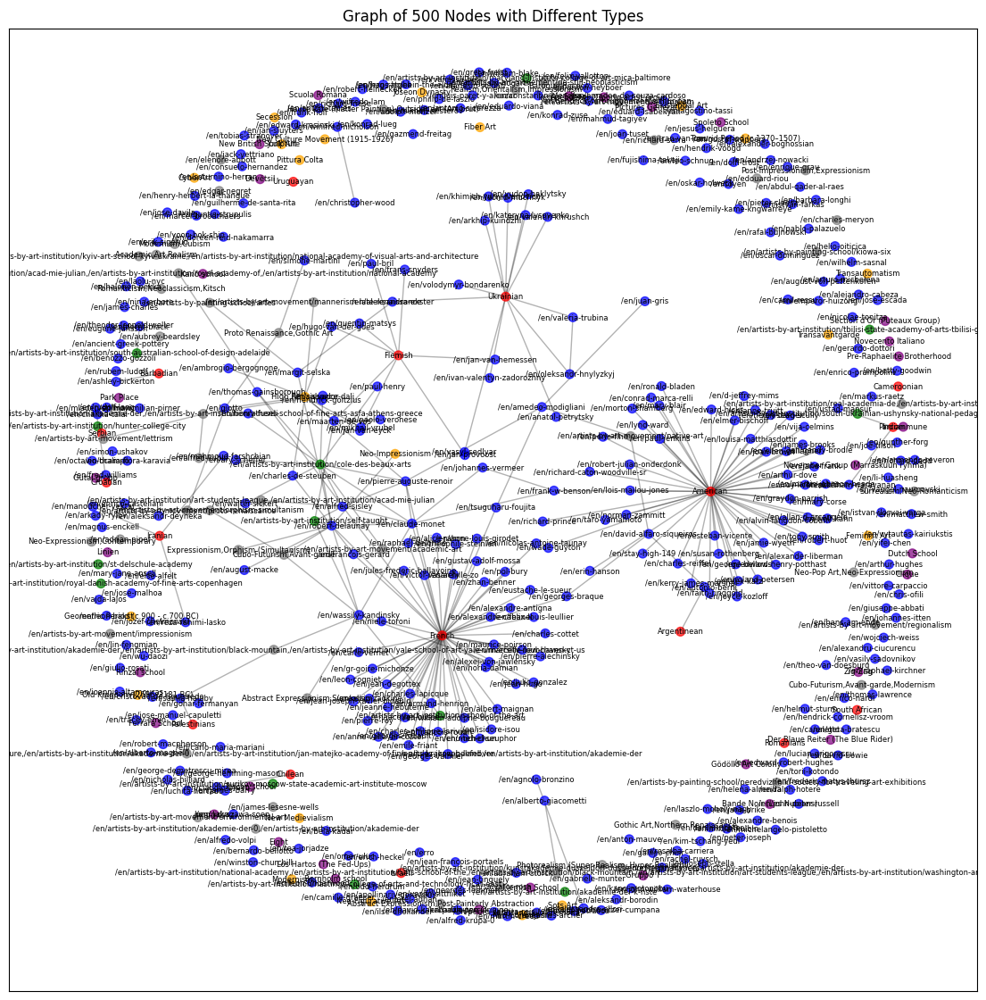

In [16]:
# Select a random sample of 500 nodes
sampled_nodes = random.sample(G.nodes(), 500)

# Create a subgraph with only the sampled nodes and their edges
G_sampled = G.subgraph(sampled_nodes).copy()

# Define colors for each type of node in the sampled graph
node_colors = []
for node in G_sampled.nodes():
    node_type = G_sampled.nodes[node].get('type', 'unknown')
    if node_type == 'artist':
        node_colors.append('blue')
    elif node_type == 'institution':
        node_colors.append('green')
    elif node_type == 'school':
        node_colors.append('purple')
    elif node_type == 'movement':
        node_colors.append('orange')
    elif node_type == 'nation':
        node_colors.append('red')
    else:
        node_colors.append('gray')

# Use spring layout with a higher k-value for more spacing
pos = nx.spring_layout(G_sampled, k=0.2, seed=42)  # Increase `k` for more spacing between nodes

# Draw the graph with a larger figure size
plt.figure(figsize=(14, 14))
nx.draw_networkx_nodes(G_sampled, pos, node_color=node_colors, node_size=50, alpha=0.7)
nx.draw_networkx_edges(G_sampled, pos, alpha=0.3)

# Create labels only for nodes that have a 'type' attribute set as 'artist'

# Create labels for all nodes by using each node's name as its label
labels = {node: node for node in G_sampled.nodes()}



nx.draw_networkx_labels(G_sampled, pos, labels, font_size=6, font_color='black')

# Display the plot
plt.title("Graph of 500 Nodes with Different Types")
plt.show()





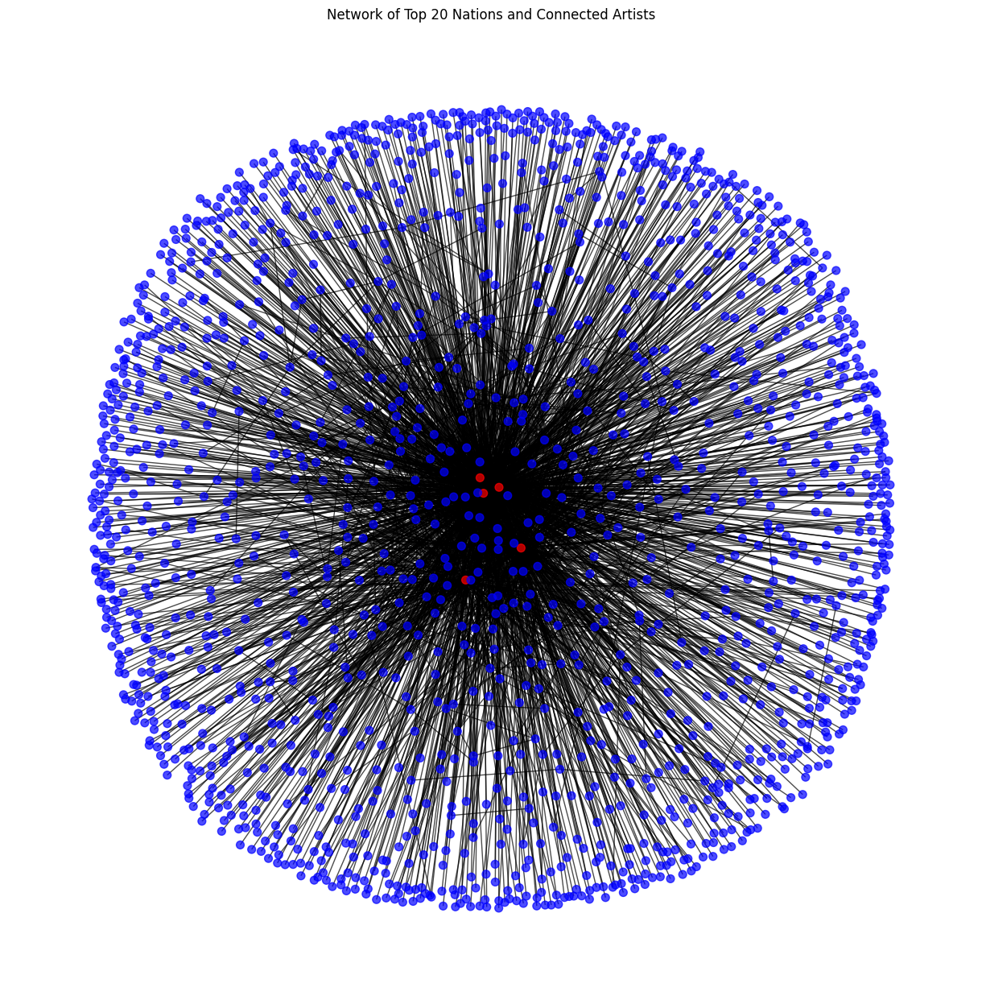

In [17]:

import matplotlib.pyplot as plt
import networkx as nx

# Get the top 20 nations
top_20_nations = artists_df['nation'].value_counts().nlargest(5).index

# Create a subgraph with only the top 20 nations and their connected artists
subgraph_nodes = set(top_20_nations)

# Add connected artists
for nation in top_20_nations:
  for neighbor in G.neighbors(nation):
    subgraph_nodes.add(neighbor)

G_top_20 = G.subgraph(subgraph_nodes)

# Define node colors
node_colors = []
for node in G_top_20.nodes():
  node_type = G_top_20.nodes[node].get('type', 'unknown')
  if node_type == 'nation':
      node_colors.append('red')
  elif node_type == 'artist':
      node_colors.append('blue')
  else:
      node_colors.append('gray')


# Plot the subgraph
plt.figure(figsize=(12, 12)) # Adjust figure size
pos = nx.spring_layout(G_top_20, k=0.3, seed=42)  # Adjust k and seed as needed
nx.draw(G_top_20, pos, with_labels=False, node_color=node_colors, node_size=50, font_size=8, alpha=0.7)
plt.title("Network of Top 20 Nations and Connected Artists")
plt.show()

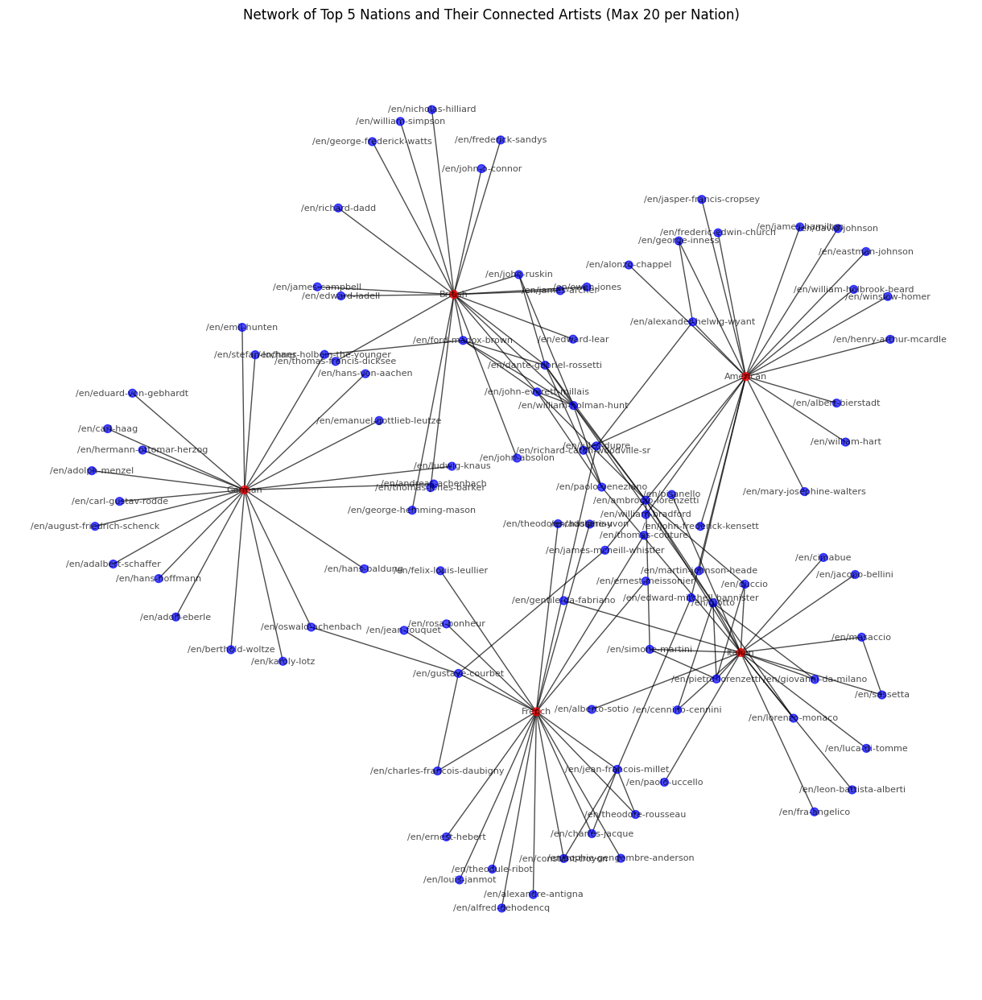

In [18]:
# Assuming 'G' is your networkx graph object from the previous code
import matplotlib.pyplot as plt
import networkx as nx

# Get the top 5 nations
top_5_nations = artists_df['nation'].value_counts().nlargest(5).index

# Initialize an empty set for nodes in the subgraph
subgraph_nodes = set(top_5_nations)

# Add up to 20 connected artists per nation
for nation in top_5_nations:
    artist_neighbors = [neighbor for neighbor in G.neighbors(nation) if G.nodes[neighbor].get('type') == 'artist']
    selected_artists = artist_neighbors[:20]  # Limit to 20 artists per nation
    subgraph_nodes.update(selected_artists)

# Create the subgraph with selected nodes
G_top_5 = G.subgraph(subgraph_nodes)

# Define node colors
node_colors = []
for node in G_top_5.nodes():
    node_type = G_top_5.nodes[node].get('type', 'unknown')
    if node_type == 'nation':
        node_colors.append('red')
    elif node_type == 'artist':
        node_colors.append('blue')
    else:
        node_colors.append('gray')

# Plot the subgraph
plt.figure(figsize=(12, 12))  # Adjust figure size
pos = nx.spring_layout(G_top_5, k=0.3, seed=42)  # Adjust k and seed as needed
nx.draw(G_top_5, pos, with_labels=True, node_color=node_colors, node_size=50, font_size=8, alpha=0.7)
plt.title("Network of Top 5 Nations and Their Connected Artists (Max 20 per Nation)")
plt.show()


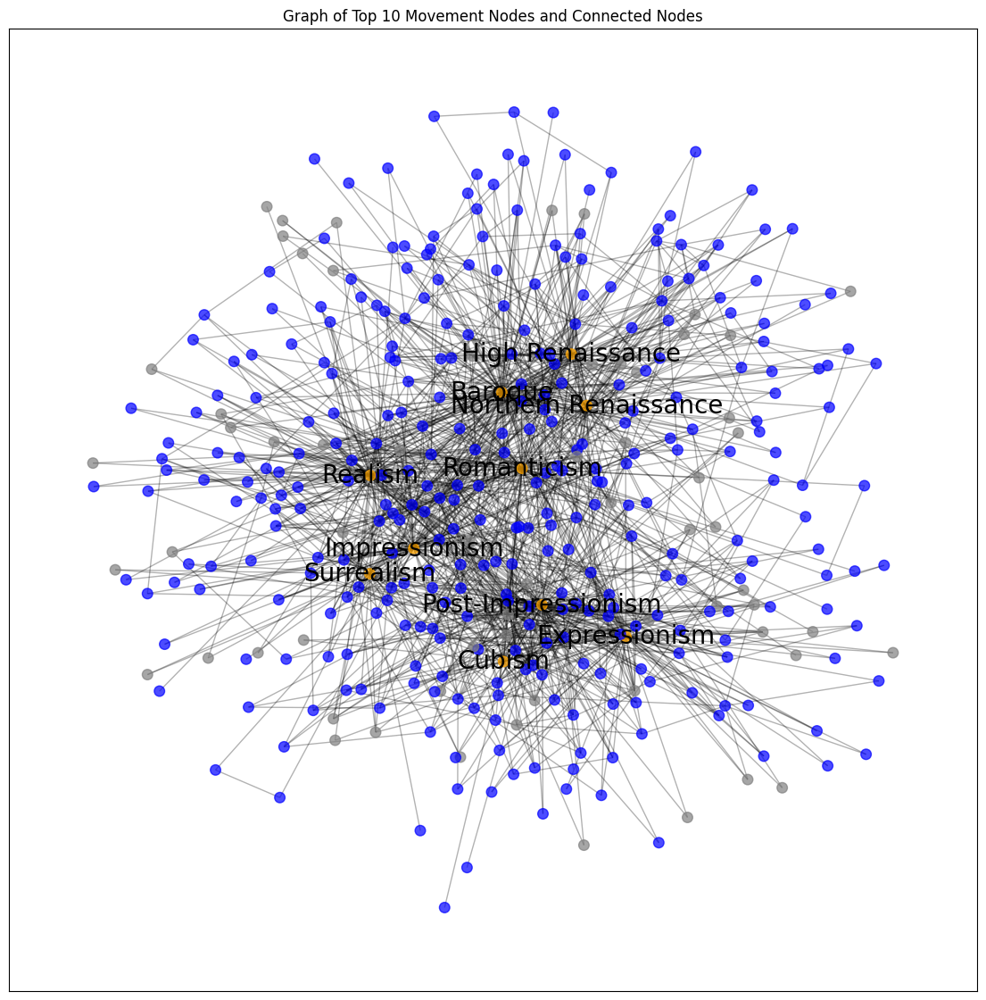

In [19]:
import matplotlib.pyplot as plt
from collections import Counter

# Step 1: Count connections for each movement node and select the top 10
movement_nodes = [node for node, data in G.nodes(data=True) if data.get('type') == 'movement']
movement_counts = Counter({node: len(list(G.neighbors(node))) for node in movement_nodes})
top_10_movements = [node for node, _ in movement_counts.most_common(10)]

# Step 2: Include top movement nodes and their connected nodes in the subgraph
nodes_to_include = set(top_10_movements)
for movement in top_10_movements:
    nodes_to_include.update(G.neighbors(movement))  # Add all neighbors of each top movement

# Step 3: Create the subgraph with selected nodes
G_top_movements = G.subgraph(nodes_to_include).copy()

# Step 4: Define node colors for each type in the subgraph
node_colors = []
for node in G_top_movements.nodes():
    node_type = G_top_movements.nodes[node].get('type', 'unknown')
    if node_type == 'artist':
        node_colors.append('blue')
    elif node_type == 'institution':
        node_colors.append('green')
    elif node_type == 'school':
        node_colors.append('purple')
    elif node_type == 'movement':
        node_colors.append('orange')
    elif node_type == 'nation':
        node_colors.append('red')
    else:
        node_colors.append('gray')

# Step 5: Use a spring layout with larger spacing for clarity
pos = nx.spring_layout(G_top_movements, k=0.3, seed=42)

# Draw the graph with specified node colors and edges
plt.figure(figsize=(14, 14))
nx.draw_networkx_nodes(G_top_movements, pos, node_color=node_colors, node_size=70, alpha=0.7)
nx.draw_networkx_edges(G_top_movements, pos, alpha=0.3, edge_color='black')

# Label only movement nodes
labels = {node: node for node, data in G_top_movements.nodes(data=True) if data.get('type') == 'movement'}
nx.draw_networkx_labels(G_top_movements, pos, labels, font_size=20, font_color='black')

# Display the plot
plt.title("Graph of Top 10 Movement Nodes and Connected Nodes")
plt.show()


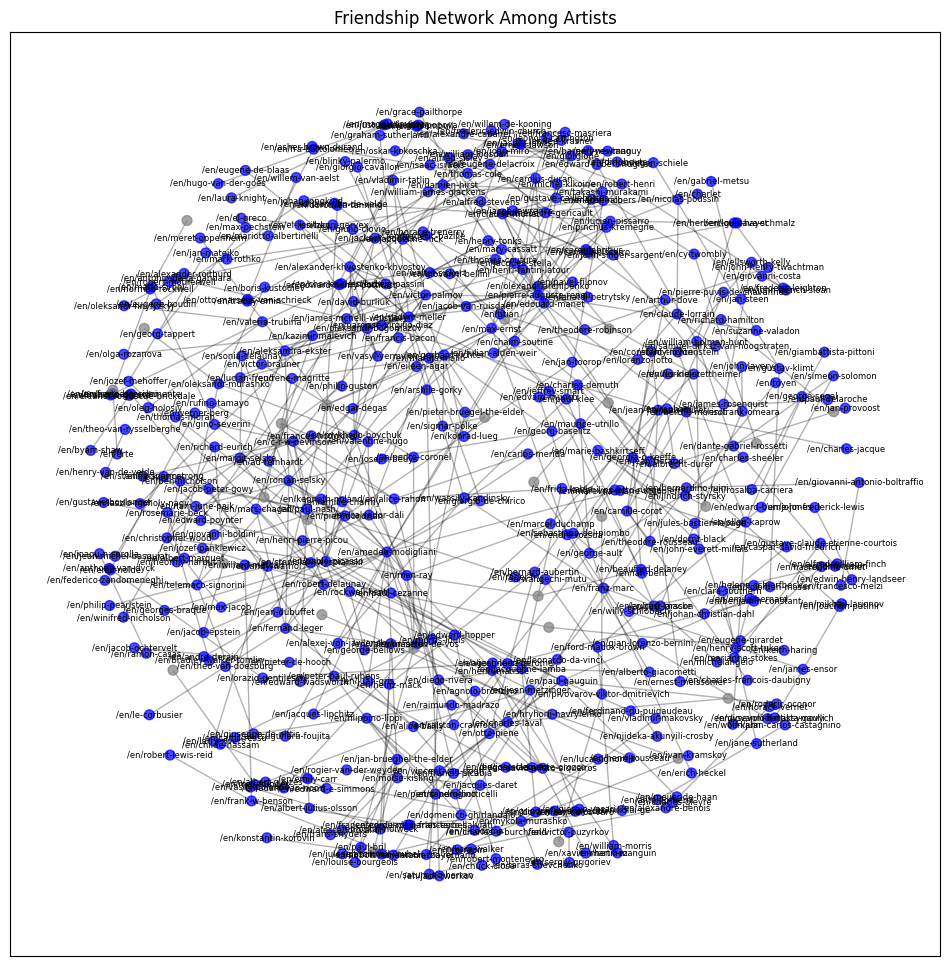

In [20]:
import matplotlib.pyplot as plt

# Create a subgraph containing only "friend" relationships
friend_edges = [(u, v) for u, v, data in G.edges(data=True) if data.get('relationship') == 'friend']
G_friends = G.edge_subgraph(friend_edges).copy()

# Define colors for each type of node in the friends subgraph
node_colors = []
for node in G_friends.nodes():
    node_type = G_friends.nodes[node].get('type', 'unknown')
    if node_type == 'artist':
        node_colors.append('blue')
    elif node_type == 'institution':
        node_colors.append('green')
    elif node_type == 'school':
        node_colors.append('purple')
    elif node_type == 'movement':
        node_colors.append('orange')
    elif node_type == 'nation':
        node_colors.append('red')
    else:
        node_colors.append('gray')

# Draw the friends subgraph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_friends, k=0.3, seed=42)  # Adjust k for spacing

nx.draw_networkx_nodes(G_friends, pos, node_color=node_colors, node_size=50, alpha=0.7)
nx.draw_networkx_edges(G_friends, pos, alpha=0.3)

# Optionally, label the nodes for better readability
labels = {node: node for node, data in G_friends.nodes(data=True) if data.get('type') == 'artist'}
nx.draw_networkx_labels(G_friends, pos, labels, font_size=6, font_color='black')

plt.title("Friendship Network Among Artists")
plt.show()


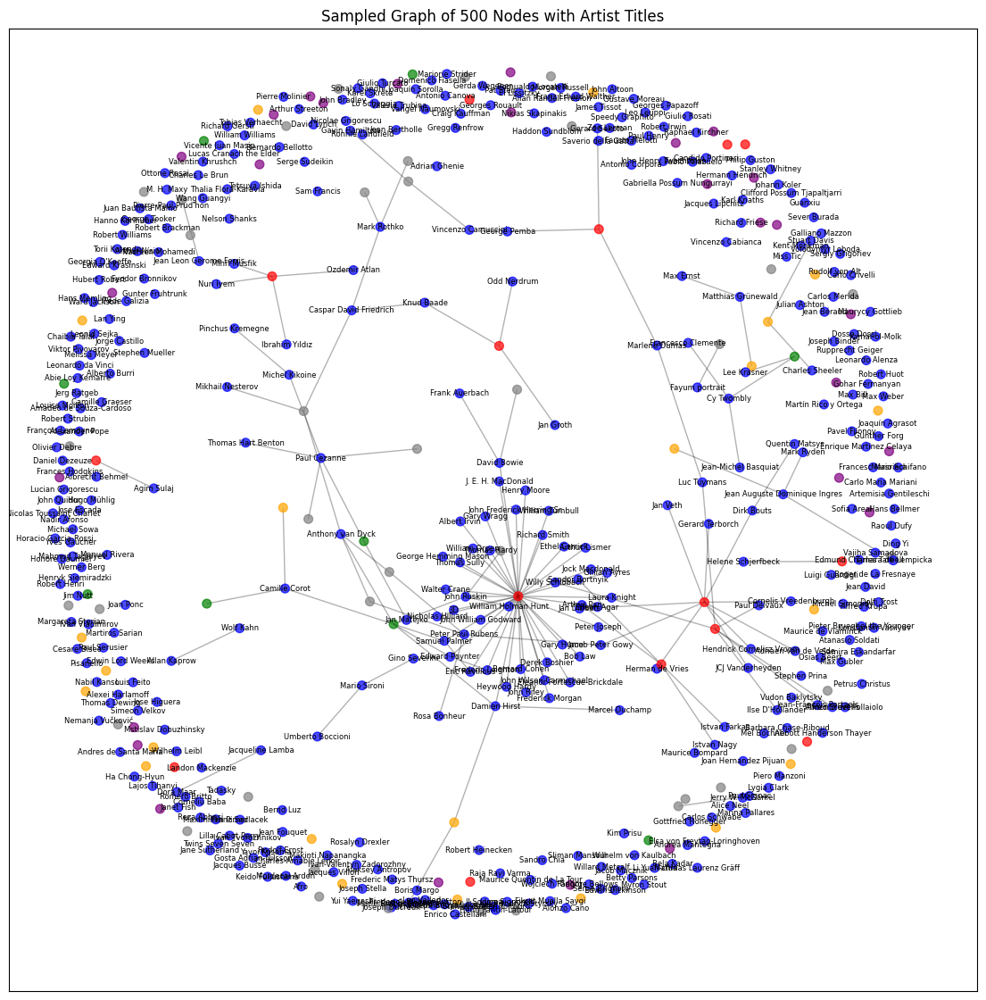

In [21]:
## NEW CODE MIGHT DELETE

import random
import matplotlib.pyplot as plt
import networkx as nx

# Select a random sample of 500 nodes
sampled_nodes = random.sample(list(G.nodes()), 500)

# Create a subgraph with only the sampled nodes and their edges
G_sampled = G.subgraph(sampled_nodes).copy()

# Define colors for each type of node in the sampled graph
node_colors = []
for node in G_sampled.nodes():
    node_type = G_sampled.nodes[node].get('type', 'unknown')
    if node_type == 'artist':
        node_colors.append('blue')
    elif node_type == 'institution':
        node_colors.append('green')
    elif node_type == 'school':
        node_colors.append('purple')
    elif node_type == 'movement':
        node_colors.append('orange')
    elif node_type == 'nation':
        node_colors.append('red')
    else:
        node_colors.append('gray')

# Use spring layout with a higher k-value for more spacing
pos = nx.spring_layout(G_sampled, k=0.2, seed=42)  # Increase `k` for more spacing between nodes

# Draw the graph with a larger figure size
plt.figure(figsize=(14, 14))
nx.draw_networkx_nodes(G_sampled, pos, node_color=node_colors, node_size=50, alpha=0.7)
nx.draw_networkx_edges(G_sampled, pos, alpha=0.3)

# Create labels only for artist nodes, using their titles if available
labels = {
    node: data['title']
    for node, data in G_sampled.nodes(data=True)
    if data.get('type') == 'artist' and data.get('title')
}
nx.draw_networkx_labels(G_sampled, pos, labels, font_size=6, font_color='black')

# Display the plot
plt.title("Sampled Graph of 500 Nodes with Artist Titles")
plt.show()


## Find influential artists, movements, institutions and artists' nations using Degree and Eigenvector Centrality

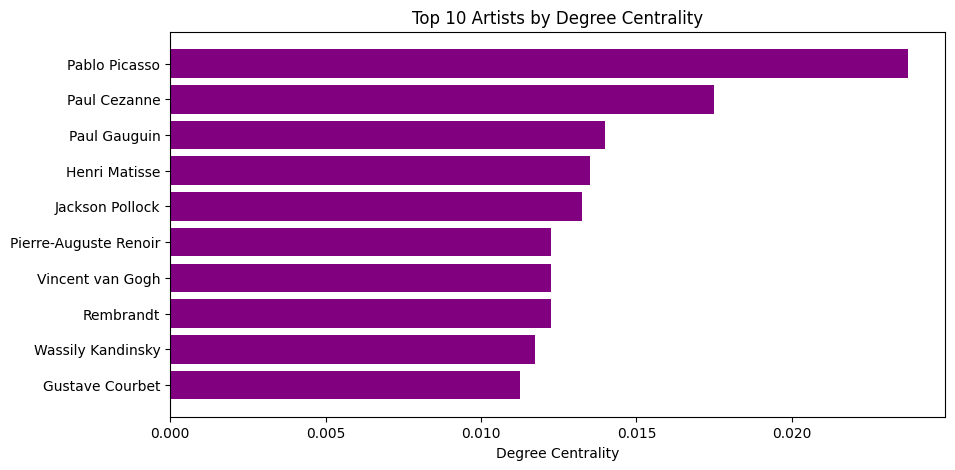

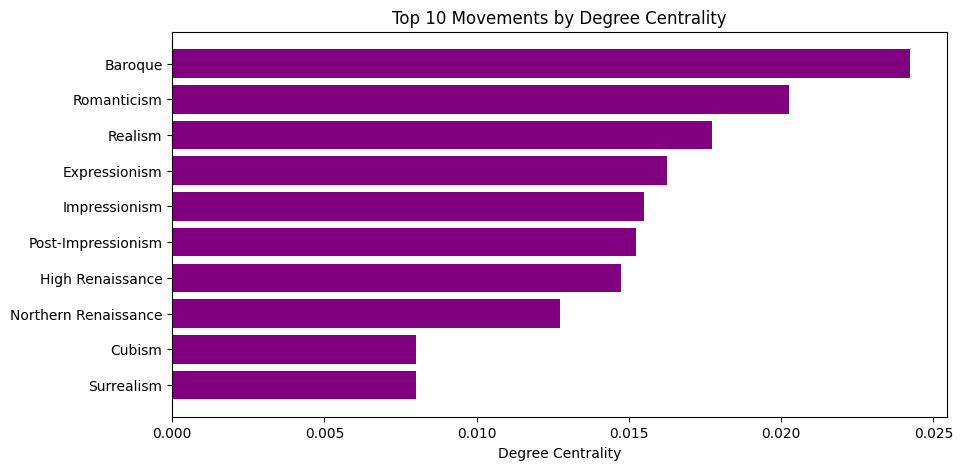

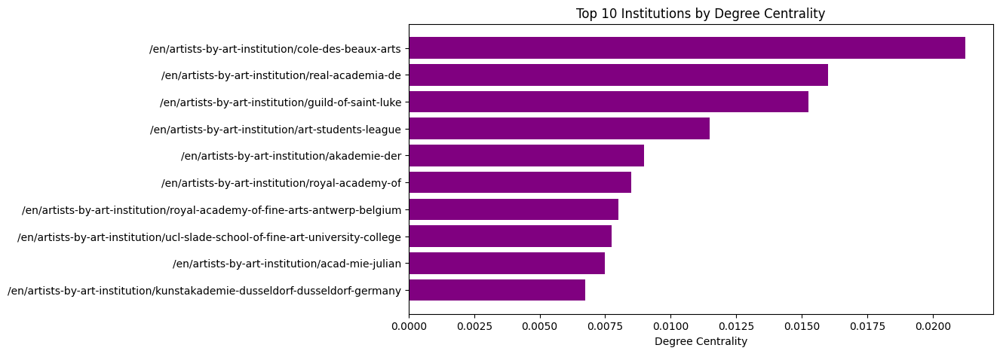

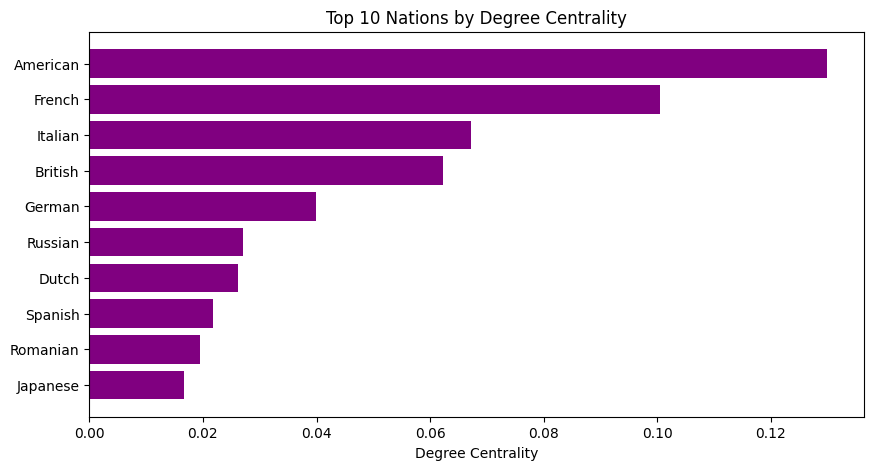

In [22]:
import matplotlib.pyplot as plt
import pandas as pd

# Helper function to sort and retrieve top nodes by degree centrality
def get_top_nodes_by_centrality(nodes, centrality_type, top_n=10):
    return sorted(nodes, key=lambda x: x[1].get(centrality_type, 0), reverse=True)[:top_n]

# Calculate degree centrality for the graph
degree_centrality = nx.degree_centrality(G)
nx.set_node_attributes(G, degree_centrality, "degree_centrality")

# Extract top 10 nodes for each type
artists = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "artist"]
movements = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "movement"]
institutions = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "institution"]
nations = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "nation"]

top_artists = get_top_nodes_by_centrality(artists, "degree_centrality", top_n=10)
top_movements = get_top_nodes_by_centrality(movements, "degree_centrality", top_n=10)
top_institutions = get_top_nodes_by_centrality(institutions, "degree_centrality", top_n=10)
top_nations = get_top_nodes_by_centrality(nations, "degree_centrality", top_n=10)

# Function to create a bar plot
def plot_centrality(top_nodes, title):
    labels = [data.get("title", node) for node, data in top_nodes]
    values = [data["degree_centrality"] for _, data in top_nodes]
    plt.figure(figsize=(10, 5))
    plt.barh(labels, values, color="purple")
    plt.xlabel("Degree Centrality")
    plt.title(title)
    plt.gca().invert_yaxis()  # Highest centrality on top
    plt.show()

# Plot for each category
plot_centrality(top_artists, "Top 10 Artists by Degree Centrality")
plot_centrality(top_movements, "Top 10 Movements by Degree Centrality")
plot_centrality(top_institutions, "Top 10 Institutions by Degree Centrality")
plot_centrality(top_nations, "Top 10 Nations by Degree Centrality")


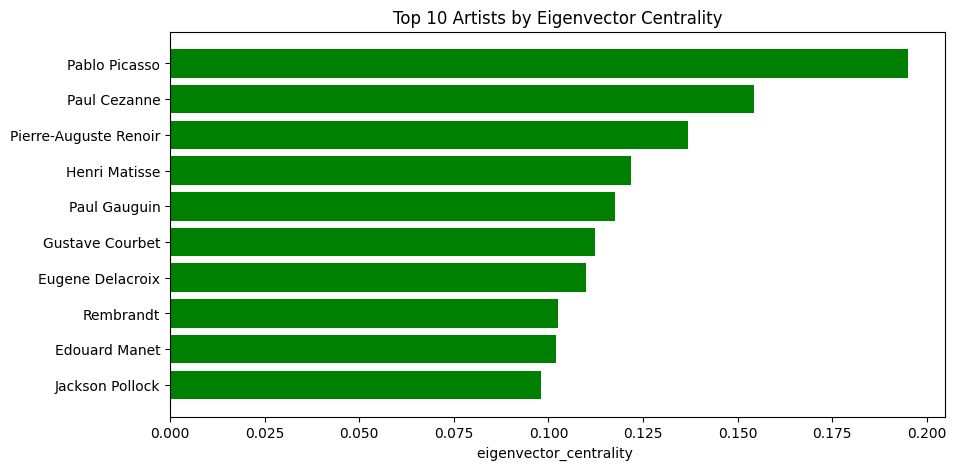

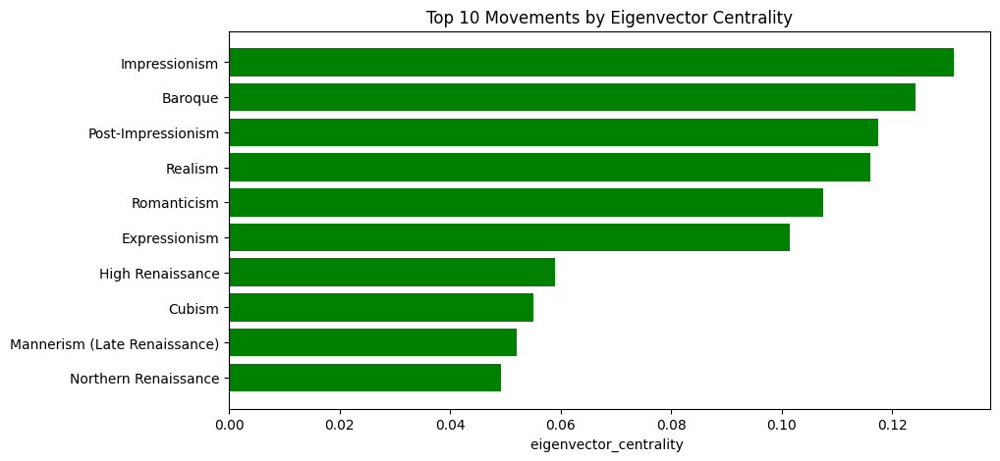

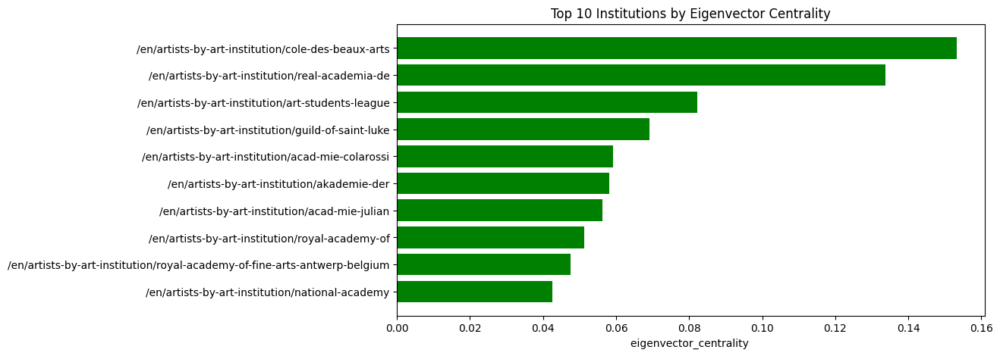

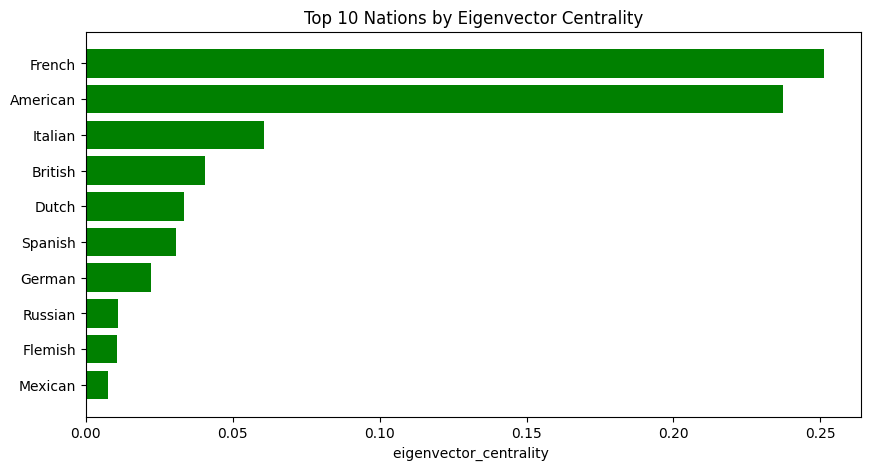

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

# Helper function to sort and retrieve top nodes by degree centrality
def get_top_nodes_by_centrality(nodes, centrality_type, top_n=10):
    return sorted(nodes, key=lambda x: x[1].get(centrality_type, 0), reverse=True)[:top_n]

# Calculate degree centrality for the graph
eigenvector_centrality= nx.eigenvector_centrality(G)
nx.set_node_attributes(G, eigenvector_centrality, "eigenvector_centrality")

# Extract top 10 nodes for each type
artists = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "artist"]
movements = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "movement"]
institutions = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "institution"]
nations = [(node, data) for node, data in G.nodes(data=True) if data.get("type") == "nation"]

top_artists = get_top_nodes_by_centrality(artists, "eigenvector_centrality", top_n=10)
top_movements = get_top_nodes_by_centrality(movements, "eigenvector_centrality", top_n=10)
top_institutions = get_top_nodes_by_centrality(institutions, "eigenvector_centrality", top_n=10)
top_nations = get_top_nodes_by_centrality(nations, "eigenvector_centrality", top_n=10)

# Function to create a bar plot
def plot_centrality(top_nodes, title):
    labels = [data.get("title", node) for node, data in top_nodes]
    values = [data["eigenvector_centrality"] for _, data in top_nodes]
    plt.figure(figsize=(10, 5))
    plt.barh(labels, values, color="green")
    plt.xlabel("eigenvector_centrality ")
    plt.title(title)
    plt.gca().invert_yaxis()  # Highest centrality on top
    plt.show()

# Plot for each category
plot_centrality(top_artists, "Top 10 Artists by Eigenvector Centrality")
plot_centrality(top_movements, "Top 10 Movements by Eigenvector Centrality")
plot_centrality(top_institutions, "Top 10 Institutions by Eigenvector Centrality")
plot_centrality(top_nations, "Top 10 Nations by Eigenvector Centrality")


## Community Detection

In [24]:

from networkx.algorithms import community
communities = community.greedy_modularity_communities(G)

# Detect communities using the Louvain method
#communities = community.louvain_communities(G)


sorted_communities = sorted(communities, key=len, reverse=True)
largest_communities = sorted_communities[:5]

print("Biggest Communities in the Network:")
for i, community in enumerate(largest_communities, start=1):
    print(f"Community {i} (Size: {len(community)}): {list(community)[:10]}")  # Show first 10 nodes in each community for brevity


Biggest Communities in the Network:
Community 1 (Size: 831): ['/en/wolfgang-tillmans', '/en/florine-stettheimer', '/en/maruja-mallo', 'Neo-Surrealism,Neo-Expressionism,Outsider art (Art brut)', '/en/archibald-motley', '/en/artists-by-art-institution/cleveland-institute-of-art-cleveland-oh-us,/en/artists-by-art-institution/norwich-university-of-the-arts-nua-norwich-uk', '/en/john-mclaughlin', '/en/harriet-korman', '/en/on-kawara', '/en/richard-serra']
Community 2 (Size: 718): ['/en/aurelio-tiratelli', '/en/jules-dupre', 'Contemporary,Postcolonial art,Classical Realism', 'Neoclassicism,Orientalism', '/en/eugene-delacroix', '/en/fausto-melotti', '/en/artists-by-art-institution/akademie-der-0,/en/artists-by-art-institution/akademie-der', '/en/filippo-de-pisis', '/en/henry-van-de-velde', '/en/adriaen-brouwer']
Community 3 (Size: 339): ['/en/monique-orsini', '/en/martin-barre', '/en/rene-duvillier', '/en/aurel-cojan', '/en/le-nain-brothers', '/en/achille-zo', '/en/anne-vallayer-coster', '/en

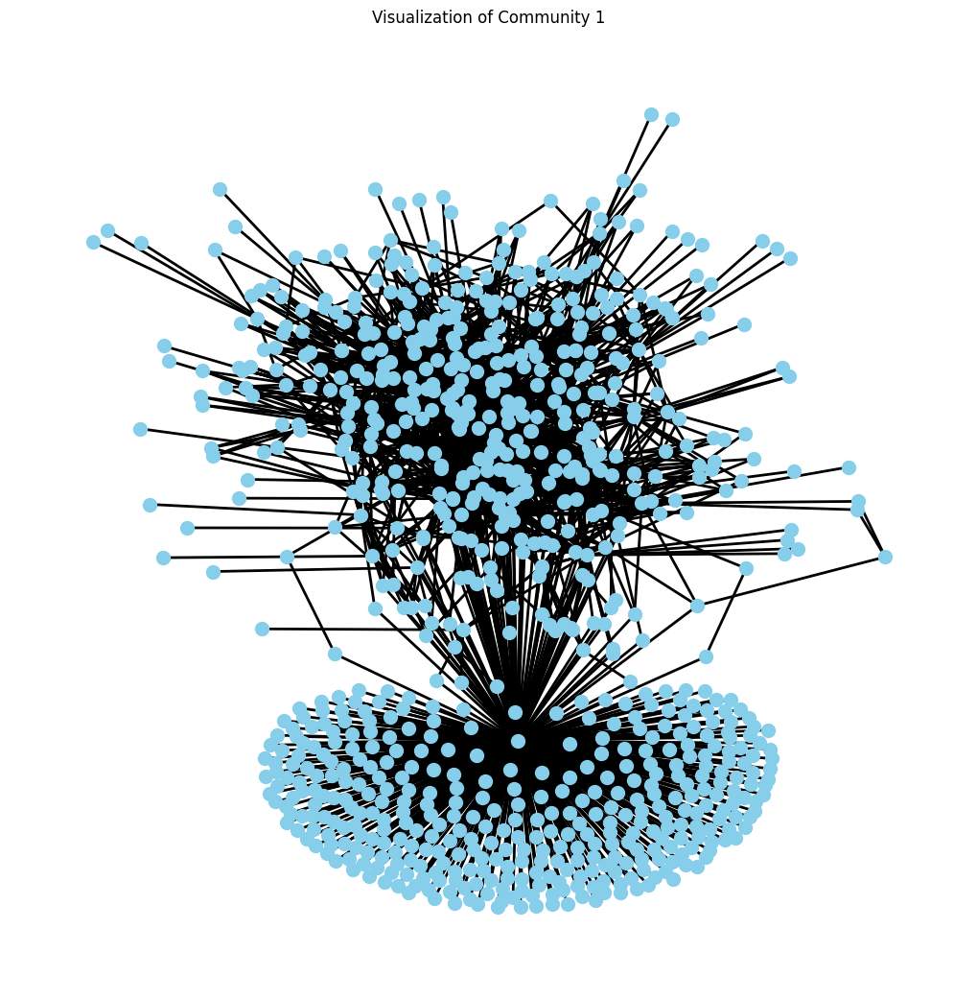

In [25]:
import matplotlib.pyplot as plt
import networkx as nx
community_to_visualize = list(communities)[0]  # Replace 0 with the index of the community you want
subgraph = G.subgraph(community_to_visualize)
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(subgraph)  # You can try different layouts here (e.g., circular_layout, spectral_layout)
nx.draw(subgraph, pos, with_labels=False, node_size=100, node_color="skyblue", font_size=8, font_color="black", width=2)
plt.title(f"Visualization of Community 1")
plt.show()

In [26]:
# Create a subgraph that includes only artist nodes
artist_nodes = [node for node, attr in G.nodes(data=True) if attr.get('type') == 'artist']
artist_subgraph = G.subgraph(artist_nodes)

# Detect communities using greedy modularity
from networkx.algorithms import community

communities = community.greedy_modularity_communities(artist_subgraph)
sorted_communities = sorted(communities, key=len, reverse=True)
largest_communities = sorted_communities[:5]

print("Biggest Communities in the Network:")
for i, community in enumerate(largest_communities, start=1):
    print(f"Community {i} (Size: {len(community)}): {list(community)[:10]}")  # Show first 10 nodes in each community for brevity

Biggest Communities in the Network:
Community 1 (Size: 153): ['/en/margit-selska', '/en/alexej-von-jawlensky', '/en/jules-dupre', '/en/camille-corot', '/en/eugene-delacroix', '/en/xavier-martinez', '/en/johan-jongkind', '/en/ellsworth-kelly', '/en/balcomb-greene', '/en/theo-van-rysselberghe']
Community 2 (Size: 116): ['/en/adam-van-noort', '/en/giorgione', '/en/james-tissot', '/en/carel-fabritius', '/en/jacob-jordaens', '/en/hans-holbein-the-younger', '/en/edouard-manet', '/en/carolus-duran', '/en/thomas-eakins', '/en/eric-fischl']
Community 3 (Size: 112): ['/en/marlene-dumas', '/en/maruja-mallo', '/en/knud-baade', '/en/victor-brauner', '/en/sam-francis', '/en/lucio-fontana', '/en/arshile-gorky', '/en/frank-stella', '/en/jose-clemente-orozco', '/en/ivan-eyre']
Community 4 (Size: 83): ['/en/jan-van-eyck', '/en/bernardino-luini', '/en/masaccio', '/en/jacques-daret', '/en/gavin-hamilton', '/en/jacopo-bassano', '/en/benjamin-west', '/en/domenico-veneziano', '/en/antonello-da-messina', '/en

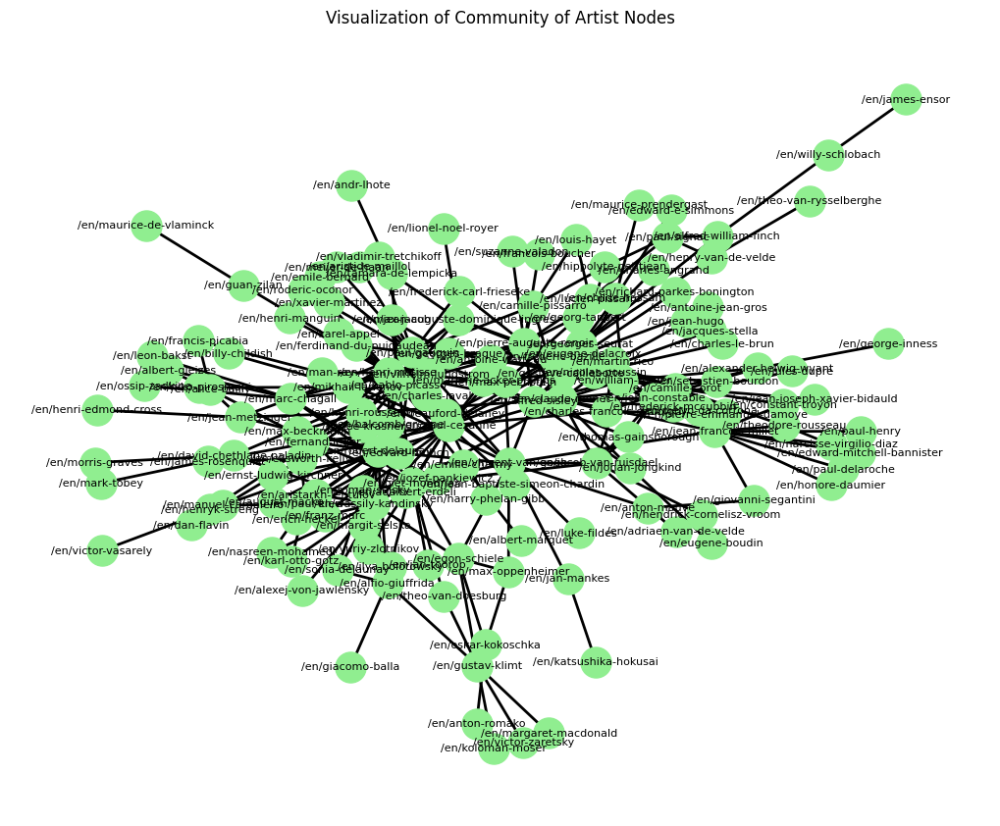

In [27]:
import matplotlib.pyplot as plt
import networkx as nx
community_to_visualize = list(communities)[0]  # Replace 0 with the index of the community you want
subgraph = G.subgraph(community_to_visualize)
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(subgraph)  # You can try different layouts here (e.g., circular_layout, spectral_layout)
nx.draw(subgraph, pos, with_labels=True, node_size=500, node_color="lightgreen", font_size=8, font_color="black", width=2)
plt.title(f"Visualization of Community of Artist Nodes")
plt.show()

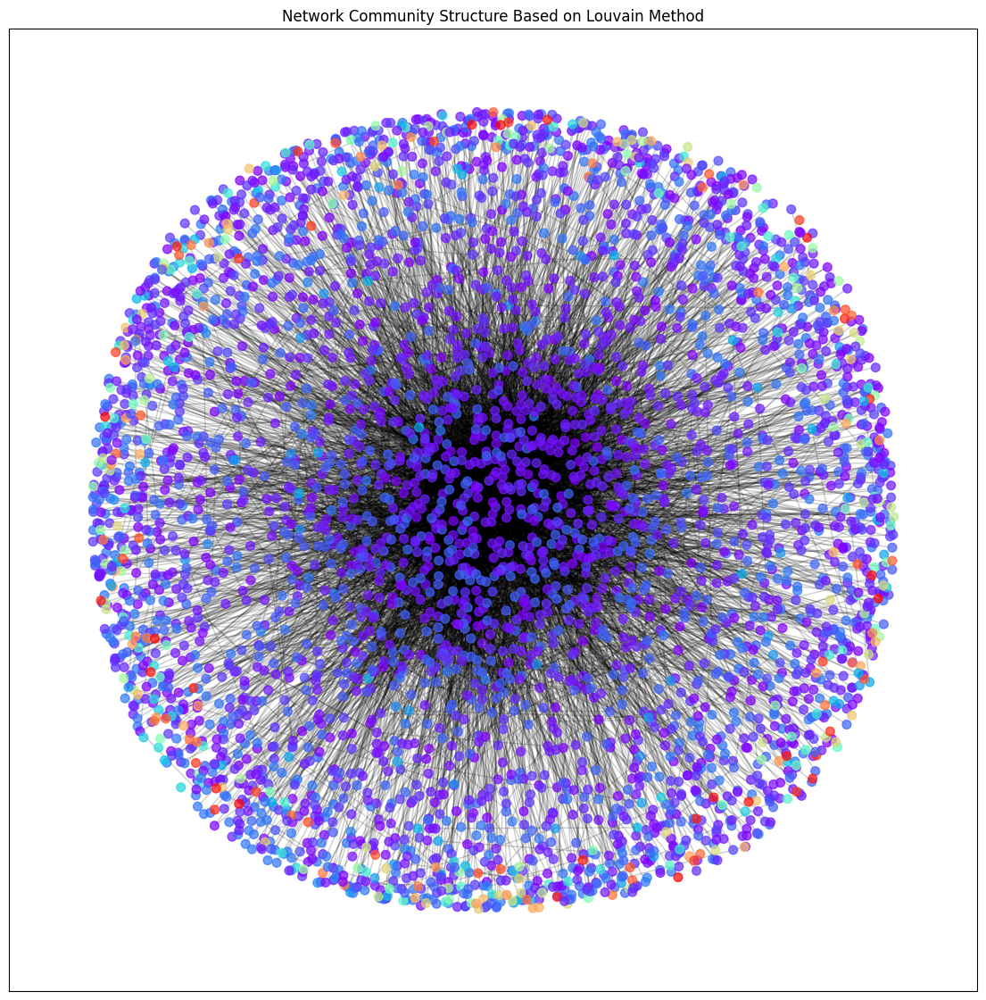

In [28]:
import community.community_louvain as community_louvain
# Apply Louvain method to detect communities
partition = community_louvain.best_partition(G)
# Assign community labels as node attributes
nx.set_node_attributes(G, partition, 'community')

# Assign color to each node based on community
community_colors = [partition[node] for node in G.nodes()]

# Use spring layout for a clearer layout with community clustering
pos = nx.spring_layout(G, seed=42, k=0.2)

# Plot the graph
plt.figure(figsize=(14, 14))
nx.draw_networkx_nodes(G, pos, node_size=50, node_color=community_colors, cmap=plt.cm.rainbow, alpha=0.7)
nx.draw_networkx_edges(G, pos, alpha=0.2)

# Title and display
plt.title("Network Community Structure Based on Louvain Method")
plt.show()


## BONUS- Interactive graph
Takes a long time to execute as well

In [29]:
!pip install dash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 44.0 MB/s eta 0:00:00


In [30]:
import random
import networkx as nx
import pandas as pd
from dash import Dash, dcc, html, Input, Output
import plotly.graph_objects as go

app = Dash(__name__)
sampled_nodes = random.sample(G.nodes(), 500)
G_sampled = G.subgraph(sampled_nodes).copy()
node_types = list(set(data.get('type', 'unknown') for _, data in G_sampled.nodes(data=True)))
def create_graph(selected_type):
    node_colors = []
    for node in G_sampled.nodes():
        node_type = G_sampled.nodes[node].get('type', 'unknown')
        if selected_type == 'All' or node_type == selected_type:
            if node_type == 'artist':
                node_colors.append('blue')
            elif node_type == 'institution':
                node_colors.append('green')
            elif node_type == 'school':
                node_colors.append('purple')
            elif node_type == 'movement':
                node_colors.append('orange')
            elif node_type == 'nation':
                node_colors.append('red')
            else:
                node_colors.append('gray')
        else:
            node_colors.append('lightgray')  # Color for non-selected nodes


    pos = nx.spring_layout(G_sampled, k=0.3, seed=42)
    x_nodes = [pos[node][0] for node in G_sampled.nodes()]
    y_nodes = [pos[node][1] for node in G_sampled.nodes()]


    edge_x = []
    edge_y = []
    for edge in G_sampled.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x += [x0, x1, None]
        edge_y += [y0, y1, None]
    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines'
    )
    node_trace = go.Scatter(
        x=x_nodes, y=y_nodes,
        mode='markers+text',
        text=[G_sampled.nodes[node].get('title', node) for node in G_sampled.nodes()],
        marker=dict(
            showscale=True,
            colorscale='Viridis',
            color=node_colors,
            size=10,
            colorbar=dict(
                thickness=15,
                title='Node Type',
                xanchor='left',
                titleside='right'
            )
        ),
        textposition="bottom center",
        hoverinfo='text'
    )

    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title='<br>Interactive Network Graph of 500 Random Nodes',
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=20, l=5, r=5, t=40),
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                    ))

    return fig

app.layout = html.Div([
    dcc.Dropdown(
        id='node-type-dropdown',
        options=[{'label': 'All', 'value': 'All'}] + [{'label': node_type.capitalize(), 'value': node_type} for node_type in node_types],
        value='All',  # Default value
        clearable=False,
        style={'width': '50%'}
    ),
    dcc.Graph(id='network-graph')
])

# Callback to update the graph based on selected node type
@app.callback(
    Output('network-graph', 'figure'),
    Input('node-type-dropdown', 'value')
)
def update_graph(selected_type):
    return create_graph(selected_type)

# Run the Dash app
if __name__ == '__main__':
    app.run_server(debug=True)


<ipython-input-30-34ef5b2364ee>:8: DeprecationWarning:

Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.



<IPython.core.display.Javascript object>